# Chapter 13: Vector Quantized Generative Adversarial Network (VQGAN)

This chapter covers

* The idea behind Vector Quantized Generative Adversarial Network (VQGAN)
* How to use a large number of vectors to represent a continuous distribution
* Building and training a VQGAN from scratch
* Using a pretrained VQGAN to reconstruct images

Vector quantized generative adversarial network (VQGAN) is a type of generative model that combines the ideas from both GANs (Generative Adversarial Networks) and VQ-VAE (Vector Quantized Variational Autoencoder). It was proposed in the paper titled "Taming Transformers for High-Resolution Image Synthesis" by Esser, Rombach, and Ommer in 2021 (https://arxiv.org/abs/2012.09841).

VQGAN is designed to generate high-quality images by combining the strengths of two generative models, GAN and VQ-VAE. VQ-VAE introduces the concept of quantization to map continuous latent representations to discrete codes, which helps in learning a more compact and meaningful latent space. GANs are used to train a generator and discriminator adversarially, with the generator aiming to create realistic images and the discriminator trying to distinguish between real and generated images. By combining these two generative models, VQGAN is able to leverage the powerful generative capabilities of GANs while maintaining the efficient and compact latent representations of VQ-VAE.

Specifically, the encoder in VQGAN takes an input image and maps it into a continuous latent space, which is then quantized into discrete codes. This quantization step is the core of the VQ-VAE component. The quantizer in VQGAN uses a codebook of discrete vectors to map the continuous latent representation from the encoder to a discrete set of vectors. This helps in making the latent space more manageable and meaningful. The decoder in VQGAN takes the quantized latent codes and reconstructs the image from them. This part of the network is trained to generate realistic images based on the quantized latent representation. Finally, the discriminator in VQGAN is part of the GAN framework and is used to adversarially train the generator (decoder) by distinguishing between real images and those generated by the decoder.

This chapter teaches you how to create and train a VQGAN from scratch. In particular, you'll include the perceptual loss in the loss function in addition to the GAN loss to ensure that the generated images are perceptually similar to the original images. You'll use features extracted from a pre-trained visual geometry group (VGG) network to compare the reconstruted images and the original images when calculating the perceptual loss. 

Finally, you'll use a pretrained VQGAN to reconstruct images and compare them to the original images. 

# 1.    Build A VQGAN from Scratch
In 2021, Esser et al proposed a generative model, Vector Quantized Generative Adversarial Networks (VQGAN; https://arxiv.org/pdf/2012.09841.pdf). The model utilizes both convolutional neural networks and a Transformer. The model consists of two stages. In the first stage, the model learns to encode images into a low-dimensional latent space. It then applies vector quantization to use a codebook of discrete vectors to represent the distribution in the latent space. The quantized latent vectors are projected back to the original image space using the decoder part of the model. In the second stage, an image is divided into a sequence of codebook vectors. A Transformer is trained to learn which codebook vector is the most likely choice based on previous codebook vectors in the image. 

In this chapter, you'll learn how to create a VQGAN and train it to reconstruct an image. We'll construct and train the Transformer in the next chapter. 

The Python programs in this chapter and the next are adapted from GitHub repositories by Dominic Rampas (https://github.com/dome272/VQGAN-pytorch) and the Computer Vision and Learning research group at Ludwig Maximilian University of Munich (https://github.com/CompVis/taming-transformers).

The VQGAN has a generator and a discriminator. The generator itself has an autoencoder structure, meaning it consists of an encoder and a decoder, similar to a variational autoencoder (VAE). However, VAE assumes a normal distribution in the latent space. Instead, in VQGAN, we'll use a codebook of discrete vectors to approximate the latent space. 

In this section, you'll learn to construct various parts of the VQGAN: the discriminator, the encoder, the decoder, and the codebook. 

## 1.1 Build A VQGAN Model
Before we build the VQGAN model, let's first have an overview on how VQGAN works. 

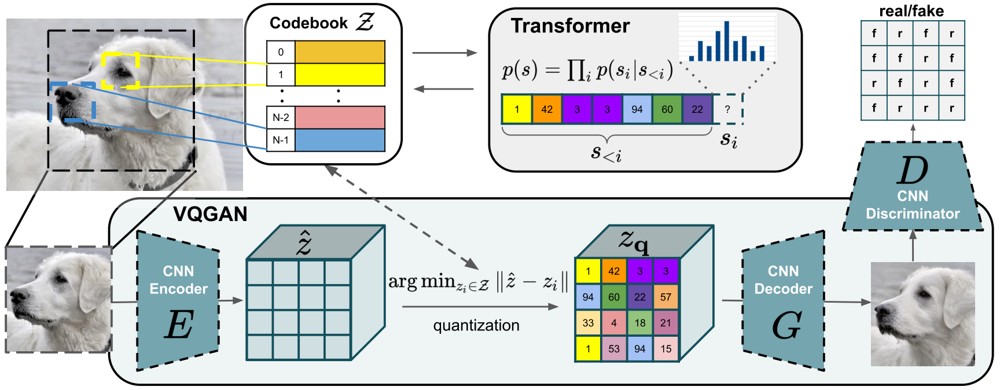

Figure 1: A diagram of the VQGAN and the Transformer model to predict image tokens (source: Taming Transformers for High-Resolution Image Synthesis https://arxiv.org/abs/2012.09841)

The lower half of the diagram is the VQGAN. The generator in VQGAN consists of an encoder, a decoder, a codebook, and a discriminator. To train VQGAN, the encoder first compresses an image into a lower-dimensional latent space. The latent vector for each image is then compared to the vectors in the codebook. We'll explain in detain on how the codebook works in the next subsection. In a nutshell, the codebook consists of a fixed number of discrete vectors. In our case, we'll use 1024 vectors to approximate the distribution in the latent space. The latent vector for each image is divided into 16x16=256 patches and each patch is compared to all the 1024 vectors in the code book. The quantized latent vector uses discrete vectors in the codebook to approximate the continuous latent vector for the image. 

The quantized latent vectors are then passed through the decoder to reconstruct the image. The reconstructed images, along with real images from the training set, are presented to the discriminator for feedback. The discriminator classifies each image as either real or fake. As training progresses, the generator (consisting of the encoder, the codebook, and the decoder) becomes better and better at reconstructing images. 

In the second stage, a Transformer is trained to predict the index of the next patch in the image based on the indexes of all previous patches in the image. We'll discuss how to train the Transformer in the next chapter. 

To organize the code in this chapter, go to the book's GitHub repository https://github.com/markhliu/txt2img and download the file VQGANutil.py and place it in the /utils/ folder on your computer. 

The VQGAN model is defined in the local module VQGANutil.py as follows:

```python
class VQGAN(nn.Module):
    def __init__(self, config):
        super(VQGAN, self).__init__()
        self.encoder = Encoder(config).to(device=config.device)
        self.decoder = Decoder(config).to(device=config.device)
        self.codebook = Codebook(config).to(device=config.device)
        self.quant_conv = nn.Conv2d(config.latent_dim,
                                    config.latent_dim,
                                    1).to(device=config.device)
        self.post_quant_conv = nn.Conv2d(config.latent_dim,
                 config.latent_dim, 1).to(device=config.device)

    def forward(self, imgs):
        encoded_images = self.encoder(imgs)
        quant_conv_encoded_images=self.quant_conv(encoded_images)
        codebook_mapping, codebook_indices, q_loss = \
            self.codebook(quant_conv_encoded_images)
        post_quant_conv_mapping = self.post_quant_conv(
            codebook_mapping)
        decoded_images = self.decoder(post_quant_conv_mapping)

        return decoded_images, codebook_indices, q_loss

    def encode(self, imgs):
        encoded_images = self.encoder(imgs)
        quant_conv_encoded_images=self.quant_conv(encoded_images)
        codebook_mapping, codebook_indices, q_loss = \
        self.codebook(quant_conv_encoded_images)
        return codebook_mapping, codebook_indices, q_loss

    def decode(self, z):
        post_quant_conv_mapping = self.post_quant_conv(z)
        decoded_images = self.decoder(post_quant_conv_mapping)
        return decoded_images

    def calculate_lambda(self, perceptual_loss, gan_loss):
        last_layer = self.decoder.model[-1]
        last_layer_weight = last_layer.weight
        perceptual_loss_grads = torch.autograd.grad(
            perceptual_loss,
            last_layer_weight, retain_graph=True)[0]
        gan_loss_grads = torch.autograd.grad(gan_loss,
                 last_layer_weight, retain_graph=True)[0]

        λ = torch.norm(perceptual_loss_grads) / (torch.norm(
            gan_loss_grads) + 1e-4)
        λ = torch.clamp(λ, 0, 1e4).detach()
        return 0.8 * λ

    @staticmethod
    def adopt_weight(disc_factor, i, threshold, value=0.):
        if i < threshold:
            disc_factor = value
        return disc_factor

    def load_checkpoint(self, path):
        self.load_state_dict(torch.load(path))
```

The above VQGAN() class takes a batch of images as input and returns the reconstructed image, the codebook indexes for each of the 256 patches in each image, and the q_loss (the loss due to approximating continuous latent vectors with discrete vectors in the codebook). 

## 1.2 How Does the Codebook Work?
To understand how the codebook works, let's pass an image through the VQGAN.

We first create a hypothetical image, as follows:

In [1]:
import torch

# create a hypothetical image
imgs=torch.randn((1,3,256,256))
print(imgs.shape)

torch.Size([1, 3, 256, 256])


The tensor imgs has a shape of (1, 3, 256, 256), meaning there is one image in the batch, with three color channels and a height and width of 256 pixels. 

Next, we create a VQGAN model:

In [2]:
# define a Config() class to store all hyperparameters
class Config:
    latent_dim=256
    image_size=256
    num_codebook_vectors=1024
    beta=0.25
    image_channels=3
    dataset_path=r"D:\MANNING\diffusion\CLIP\Images"
    device="cuda"
    batch_size=8
    epochs=10
    learning_rate=2.25e-05
    beta1=0.5
    beta2=0.9
    disc_start=10000
    disc_factor=1
# instantiate the class
config=Config()

# create a VQGAN model
from utils.VQGANutil import VQGAN
vqgan = VQGAN(config).to(config.device)

Let's pass the image through the encoder to obtain the continuous latent vectors:

In [3]:
# pass the image through the encoder
encoded_images = vqgan.encoder(imgs.to(config.device))
# pass the output from encoder through a conv layer
quant_conv_encoded_images = vqgan.quant_conv(encoded_images)
print(quant_conv_encoded_images.shape)

torch.Size([1, 256, 16, 16])


The output has a shape of (1, 256, 16, 16), meaning the image is now divided into a 16x16 grid, with a patch in each grid position. Each patch is represented by a 256-value vector in the latent space. 

Each of the 256-value vectors can take any value, which makes it hard to model. In VAEs, we assume that these vectors follow normal distributions. Doing so dramatically reduces the number of parameters we need to train, since each normal distribution can be summarized by two parameters: the mean and the standard deviation.

However, the true distribution may not be normal. In VQGAN, we instead use a discrete distribution to approximate the actual distribution. Specifically, we'll create a codebook of 1024 discrete vectors and see which vector has the closest "distance" to the actual latent vector and use it to approximate the actual continuous latent vector. 

The codebook is defined in the local module as follows:

```python
class Codebook(nn.Module):
    def __init__(self, config):
        super(Codebook, self).__init__()
        self.num_codebook_vectors = config.num_codebook_vectors
        self.latent_dim = config.latent_dim
        self.beta = config.beta

        self.embedding = nn.Embedding(self.num_codebook_vectors,
                                      self.latent_dim)
        self.embedding.weight.data.uniform_(
            -1.0 / self.num_codebook_vectors, 
            1.0 / self.num_codebook_vectors)

    def forward(self, z):
        z = z.permute(0, 2, 3, 1).contiguous()
        z_flattened = z.view(-1, self.latent_dim)
        d = torch.sum(z_flattened**2, dim=1, keepdim=True) + \
        torch.sum(self.embedding.weight**2, dim=1) - \
        2*(torch.matmul(z_flattened, self.embedding.weight.t()))
        min_encoding_indices = torch.argmin(d, dim=1)
        z_q = self.embedding(min_encoding_indices).view(z.shape)
        loss = torch.mean((z_q.detach() - z)**2) + \
            self.beta * torch.mean((z_q - z.detach())**2)
        z_q = z + (z_q - z).detach()
        z_q = z_q.permute(0, 3, 1, 2)
        return z_q, min_encoding_indices, loss
```

To create a code book, we first initiate a PyTorch embedding layer as follows:

In [4]:
embedding = torch.nn.Embedding(1024, 256).to(config.device)

We'll use the weight in this embedding layer as the discrete vectors (i.e., the codebook). To understand how this works, let's first check out the shape of the weights in the embedding layer:

In [5]:
print(embedding.weight.shape)

torch.Size([1024, 256])


As you can see, the weights in the embedding layer has a shape of (1024, 256). We can treat them as 1024 vectors, and each vector has 256 values in it. These are the 1024 discrete vectors in our codebook. Note that the weights are randomly initialized when the model is created but will be adjusted during training. Therefore, the values of these 1024 vectors are determined by the training data. 

The input to the codebook, quant_conv_encoded_images, is an image with 16 by 16 patches. Each patch is a 256-value vector. The job of the code book is to replace each of the patches with one of the 1024 discreate vectors in the codebook.

You may wonder: how do we know which one of the 1024 vectors to use in the codebook? The answer lies in the distance between each patch and the 1024 discrete vectors.

Below, we calculate the distance between the 256 patches in the image and the 1024 discreate vectors:

In [6]:
z = quant_conv_encoded_images.permute(0, 2, 3, 1).contiguous()
z_flattened = z.view(-1, 256)
d = torch.sum(z_flattened**2, dim=1, keepdim=True) + \
    torch.sum(embedding.weight**2, dim=1) - \
    2*(torch.matmul(z_flattened, embedding.weight.t()))
print(d.shape)

torch.Size([256, 1024])


The shape of the tensor d is (256,1024): it stores the distance between each of the 256 patches in the image and each of the 1024 discrete vectors. 

To find out which vector we should use to represent each patch, we find out the vector with the shortest distance with the patch, as follows:

In [7]:
min_encoding_indices = torch.argmin(d, dim=1)
z_q = embedding(min_encoding_indices).view(z.shape)
loss = torch.mean((z_q.detach() - z)**2) + \
    config.beta * torch.mean((z_q - z.detach())**2)
z_q = z + (z_q - z).detach()
z_q = z_q.permute(0, 3, 1, 2)

Since the discrete vectors are approximations of the continuous vectors, the loss measures the distance between the two. Obviously, the more discrete vectors we use, the lower the loss. But at the same time, it takes longer to train the model if we use a large number of discrete vectors. 

## 1.3 Create A Discriminator in VQGAN
The VQGAN model we just created is the generator part of the model. It's capable of compressing an image into the latent space and then reconstruct the image. We'll use a discriminator to provide feedback on the reconstructed image so that the generator can gradually learn to do its job better. 

We define the Discriminator() class in the local module VQGANutil.py as follows:

```python
class Discriminator(nn.Module):
    def __init__(self, config, num_filters_last=64, n_layers=3):
        super(Discriminator, self).__init__()
        layers=[nn.Conv2d(config.image_channels, num_filters_last,
                            4, 2, 1), nn.LeakyReLU(0.2)]
        num_filters_mult = 1
        for i in range(1, n_layers + 1):
            num_filters_mult_last = num_filters_mult
            num_filters_mult = min(2 ** i, 8)
            layers += [
            nn.Conv2d(num_filters_last * num_filters_mult_last, 
                      num_filters_last * num_filters_mult, 4,
                      2 if i < n_layers else 1, 1, bias=False),
            nn.BatchNorm2d(num_filters_last * num_filters_mult),
            nn.LeakyReLU(0.2, True)]
        layers.append(nn.Conv2d(
            num_filters_last * num_filters_mult, 1, 4, 1, 1))
        self.model = nn.Sequential(*layers)
    def forward(self, x):
        return self.model(x)
```

The discriminator takes in batches of images either from the training set or from the generator. It assigns a probability to each image that it's real (from the training set) rather than fake (from the generator). 

We instantiate the class and create a discriminator, like so:

In [8]:
from utils.VQGANutil import Discriminator, weights_init

discriminator = Discriminator(config).to(config.device)
discriminator.apply(weights_init)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  )
)

With that, we have created a complete VQGAN model, with a generator and a discriminator. 

# 2.	Train A VQGAN Model from Scratch
Now that we have a VQGAN model, let's train the model from scratch by using the Flickr 8k data you used before.

In this section, we'll first load the training data and process them for training. We'll then discuss the loss function in the training process. Finally, we'll design a training loop and train the model for two epochs to see the results. Since we lack the necessary supercomputing facilities, we'll train the model just for educational purposes so that you know the steps involved in the training process. Later in the chapter, you'll use a pretrained VQGAN model to reconstruct high resolution images. 

## 2.1	Prepare the Training Data
We first define a Data() class in the local module as follows:

In [9]:
import os
import albumentations
import numpy as np
import torch.nn as nn
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

class Data(Dataset):
    def __init__(self, config):
        self.imgs=[os.path.join(config.dataset_path,f) for f 
                   in os.listdir(config.dataset_path)]
        self.rescaler=albumentations.SmallestMaxSize(
            max_size=config.image_size)
        self.cropper=albumentations.CenterCrop(
            height=config.image_size,
            width=config.image_size)
        self.preprocessor=albumentations.Compose([self.rescaler,
                                                  self.cropper])
    def __len__(self):
        return len(self.imgs)
    def __getitem__(self, i):
        image = Image.open(self.imgs[i])
        if not image.mode == "RGB":
            image = image.convert("RGB")
        image = np.array(image).astype(np.uint8)
        image = self.preprocessor(image=image)["image"]
        image = (image / 127.5 - 1.0).astype(np.float32)
        image = image.transpose(2, 0, 1)
        return image      

Note that the Data() class takes config as the input. In particular, it uses config.dataset_path as the image folder and process all images in the folder to form a training dataset. 

We then call the Data() class to process all images in the Flickr 8k dataset, like so:

In [10]:
trainset=Data(config)

We define a Config() class to contain all the hyperparameters used in our ViT. patch_size=4 each patch of image has a height and width of 4 pixels. Since our training images are 32 by 32 pixels, this means we divided each image into 8x8=64 patches. hidden_size=48 means each patch is converted into a 48-value vector. We'll use multi-head attention to capture different aspects of relations among tokens in the image, so we set num_attention_heads=4. This means we use fur attention heads instead of just one. We'll explain other hyperparameters as we go along. 

To divide an image into 64 patches, we define a PatchEmbeddings() class in the local module file ViTutil.py that you just downloaded:

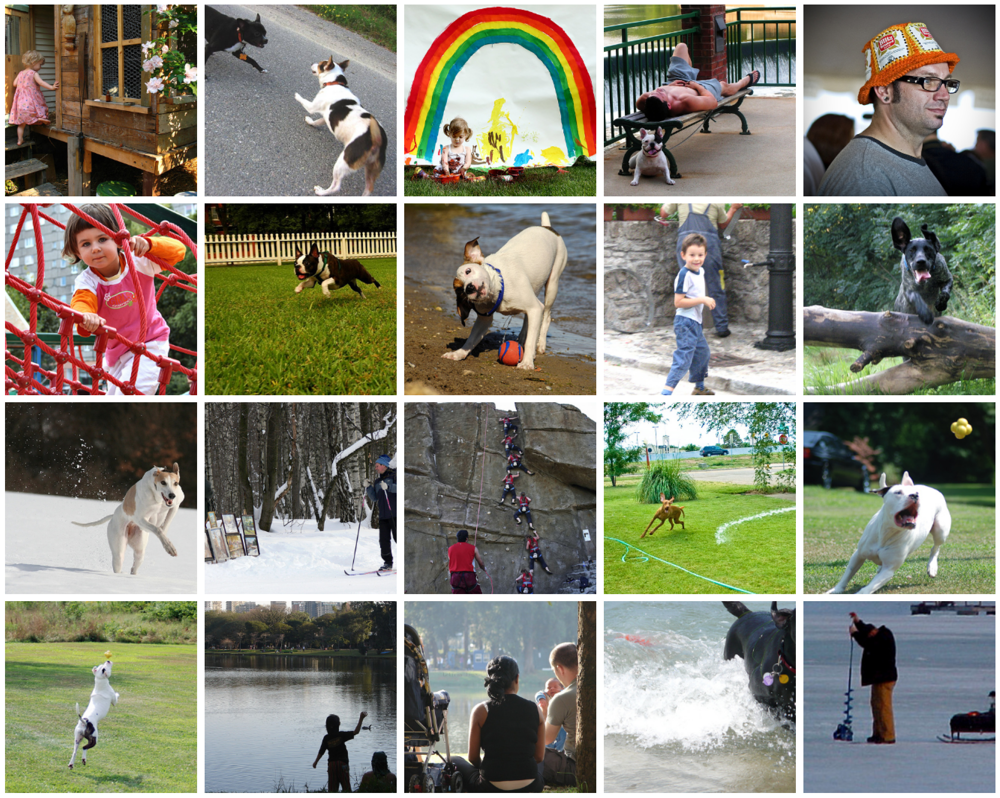

In [11]:
plt.figure(dpi=100,figsize=(20,16))
for i in range(20):
    plt.subplot(4,5,i+1)
    plt.imshow(trainset[i].transpose(1,2,0)/2+0.5)
    plt.axis("off")
plt.tight_layout()
plt.show()

Next, we place the training data in batches. The batch size is set at 8 to avoid the GPU running out of memory due to the high resolution of the images. If your GPU has a small memory size, change batch size to 4 or even 2. 

In [12]:
trainloader=DataLoader(trainset,batch_size=config.batch_size,
                       shuffle=True)

## 2.2	Understanding VGG Loss as a Perceptual Loss
In image generation tasks, traditional loss functions such as pixel-wise mean absolute error (MAE) or mean squared error (MSE) often fail to capture the perceptual quality of images as perceived by humans. To address this limitation, perceptual loss functions have been introduced, which aim to measure the perceptual and semantic differences between images. One popular approach to implementing perceptual loss is through the use of features extracted from pre-trained convolutional neural networks like the VGG network. This approach is commonly referred to as VGG Loss.

Instead of comparing images directly in the pixel space, perceptual losses compare high-level feature representations extracted from deep neural networks. These features encode complex structures, textures, and semantic information, enabling the loss function to assess image similarity based on perceptual quality.

The VGG network is a deep convolutional neural network architecture introduced by the Visual Geometry Group (VGG) from the University of Oxford in 2014. The most common variants are VGG-16 and VGG-19, which have 16 and 19 layers respectively. These networks are known for their simplicity and effectiveness in image recognition tasks and have been widely used as feature extractors in various computer vision applications.

Mathematically, VGG Loss can be defined as:
$$L_{VGG}=\sum_{l}\frac{1}{N_l}||\phi_l(I_{generated})-\phi_l(I_{original})||_2$$
where $l$ is the index of the selected VGG layer; $N_l$ is the number of elements in layer $l$; $\phi_l$ is the feature map extracted for layer $l$; $I_{generated}$ and $I_{original}$ are the reconstructed and the original images, respectively; $||.||_2$ is the L2 norm, measuring the difference between feature maps. 

## 2.3	Loss Functions and Optimizers
The generator in VQGAN is trying to minimize several losses. The first loss is the reconstruction loss, which is measured as the mean absolute error (L1 loss, at the pixel level) between the original image and the reconstructed image. The second loss is the perceptual loss. Perceptual loss is a key concept in advanced image generation models because it helps these models generate high-quality, detailed images. It is a measure of how perceptually different two images are from each other. Unlike the reconstruction loss that measures pixel-wise differences, perceptual loss assesses differences based on high-level features extracted from the images. This approach aligns more closely with how humans perceive visual content, focusing on patterns, textures, and structural elements rather than individual pixel values.

To calculate perceptual loss, we usually use a pre-trained convolutional neural network (CNN), often a variant of the VGG network trained on ImageNet. The network extracts features from both the generated image and the target (real) image at various layers. Once features are extracted from both images at multiple layers, perceptual loss is computed by measuring the differences between these features. This might include differences in content and style features, depending on the specific layer of the network used for comparison.

Since this is a GAN model, generated images, along with real images from the training set, are presented to the discriminator for evaluation. The discriminator's job is to assign a high valuation to real samples and a low evaluation to generated samples. The generator's job is to create images indistinguishable from real images so that the discriminator gives a high score to those images. Therefore, the generator is also trying to minimize a GAN loss, which is the negative of the score assigned by the discriminator.

The discriminator in the model is trying to minimize the GAN loss. This is achieved if the discriminator gives a score as high as possible to ream samples (i.e., from the training set) and a score as low as possible to fake samples (i.e., created by the generator).

Below, we define the perceptual loss function, learning rate, and the optimizers for the generator and discriminator:

In [13]:
from utils.VQGANutil import LPIPS

perceptualloss = LPIPS().eval().to(config.device)
lr = config.learning_rate
opt_vq = torch.optim.Adam(
    list(vqgan.encoder.parameters()) +
    list(vqgan.decoder.parameters()) +
    list(vqgan.codebook.parameters()) +
    list(vqgan.quant_conv.parameters()) +
    list(vqgan.post_quant_conv.parameters()),
    lr=lr, eps=1e-08, betas=(config.beta1, config.beta2)
)
opt_disc = torch.optim.Adam(discriminator.parameters(),
    lr=lr, eps=1e-08, betas=(config.beta1, config.beta2))

## 2.4	The Training Loop
We'll train the model for only two epochs to illustrate the training process.

In [14]:
from torchvision import utils as vutils
import torch.nn.functional as F
from tqdm import tqdm

steps_per_epoch = len(trainloader)
for epoch in range(2):
    with tqdm(range(len(trainloader))) as pbar:
        for i, imgs in zip(pbar, trainloader):
            with torch.cuda.amp.autocast(dtype=torch.float16):
                imgs = imgs.to(device=config.device)
                decoded_images, _, q_loss = vqgan(imgs)
                disc_real = discriminator(imgs)
                disc_fake = discriminator(decoded_images)
                disc_factor=vqgan.adopt_weight(config.disc_factor, 
                     epoch*steps_per_epoch+i, 
                     threshold=config.disc_start)
                perceptual_loss = perceptualloss(imgs,
                                                 decoded_images)
                rec_loss = torch.abs(imgs - decoded_images)
                perceptual_rec_loss = perceptual_loss + rec_loss
                perceptual_rec_loss = perceptual_rec_loss.mean()
                g_loss = -torch.mean(disc_fake)
                lmd = vqgan.calculate_lambda(perceptual_rec_loss,
                                             g_loss)
                vq_loss=perceptual_rec_loss+q_loss+lmd*g_loss
                d_loss_real = torch.mean(F.relu(1. - disc_real))
                d_loss_fake = torch.mean(F.relu(1. + disc_fake))
                gan_loss = disc_factor * 0.5 * (d_loss_real
                                                + d_loss_fake)
                opt_vq.zero_grad()
                vq_loss.backward(retain_graph=True)
                opt_disc.zero_grad()
                gan_loss.backward()
                opt_vq.step()
                opt_disc.step()
            if i % 100 == 0:
                with torch.no_grad():
                    real_fake_images = torch.cat((imgs[:4], 
                          decoded_images[:4])).add(1).mul(0.5)
                    vutils.save_image(real_fake_images,
                          f"files/{epoch}_{i}.jpg", nrow=4)
            pbar.set_postfix(VQ_Loss=np.round(
                vq_loss.cpu().detach().numpy().item(), 5),
                GAN_Loss=np.round(
                    gan_loss.cpu().detach().numpy().item(), 3))
            pbar.update(0)
        torch.save(vqgan.state_dict(),
                   f"files/vqgan_epoch_{epoch}.pt")

The above training takes about an hour if you use GPU training. It may take several hours otherwise. 

# 3	Use the Trained VQGAN to Reconstruct Images

We'll use our trained VQGAN to reconstruct images in the Flickr 8k dataset. 

First, we reload the trained model as follows:

In [15]:
cpath='files/vqgan_epoch_1.pt'
vqgan.load_checkpoint(cpath)
vqgan.eval()

We then select five images in the Flickr 8k dataset for testing:

In [16]:
from torchvision import utils as vutils
test=[]
for i in range(5):
    test.append(torch.Tensor(trainset[15+i]).unsqueeze(0))
imgs=torch.cat(test)

Now we can feed the five images to the trained model and obtain the reconstructed images:

In [17]:
imgs=imgs.to(device=config.device)
decoded_images, indexes, q_loss = vqgan(imgs)
real_fake_images = torch.cat((imgs, 
              decoded_images)).add(1).mul(0.5)

Let's plot both the original images and the reconstructed images so that we can compare them:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 1291.5, 517.5, -0.5)

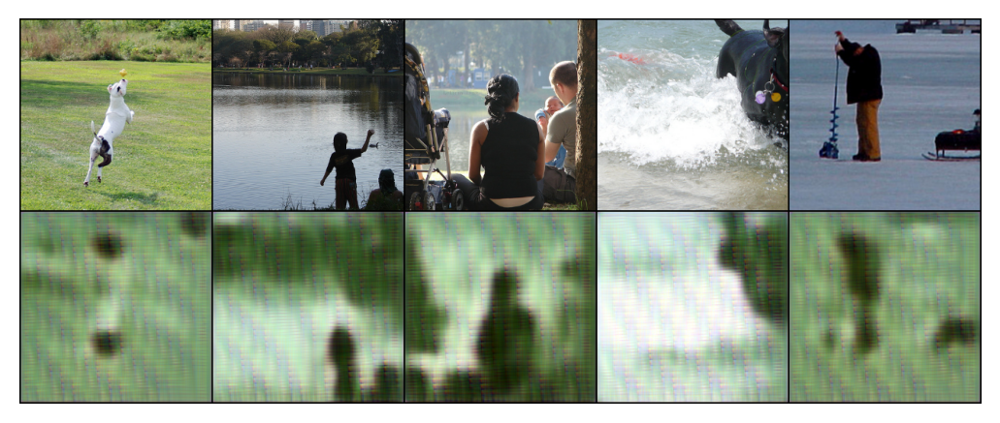

In [18]:
grid_img=vutils.make_grid(real_fake_images,nrow=5)
plt.figure(dpi=200)
plt.imshow(grid_img.permute(1, 2, 0).cpu())#/2+0.5)
plt.axis("off")

The reconstructed images start to look like the original images. However, the quality of the reconstructed images are still low. This is due to the fact that our training dataset is small and we lack supercomputing facilities to train our model on a large dataset. 

In the next section, you'll learn to reconstruct images by using pretrained VQGAN models.

# 4 Image Reconstruction Using A Pretrained VQGAN
We'll use a pretrained VQGAN model based on the GitHub repository https://github.com/CompVis/taming-transformers. You'll first learn to reconstruct an online image of a squirrel. After that, we'll reconstruct the same five images in Flickr 8k that we tried in the last subsection so that we can compare results. 


## 4.1 Reconstruct An Online Image with the Pretrained VQGAN
First, we need to clone the GitHub repository and copy all files to a local folder on our computer, like so:

In [19]:
!git clone https://github.com/CompVis/taming-transformers

Cloning into 'taming-transformers'...
Updating files:  95% (686/719)
Updating files:  96% (691/719)
Updating files:  97% (698/719)
Updating files:  98% (705/719)
Updating files:  99% (712/719)
Updating files: 100% (719/719)
Updating files: 100% (719/719), done.


Let's download the pretrained weights and the model specification as follows:

In [20]:
import requests, os

# download pretrained weights
u1='https://heibox.uni-heidelberg.de/f/140747ba53464f49b476/?dl=1' 
u2='https://heibox.uni-heidelberg.de/f/6ecf2af6c658432c8298/?dl=1'

f1="files/vqgan_imagenet_f16_1024.ckpt"
f2="files/vqgan_imagenet_f16_1024.yaml"

# takes a couple of minutes depending on your internet speed
if not os.path.exists(f1):
    fb1=requests.get(u1)
    with open(f1,"wb") as f:
        f.write(fb1.content)

if not os.path.exists(f2):
    fb2=requests.get(u2)
    with open(f2,"wb") as f:
        f.write(fb2.content)

We need to make a small modification due to deprecated functions in PyTorch. Open the file /traming-transformers/taming/data/utils.py and in line 152, change string_classes to str. After that, delete line 11 of the file. 

We can now import the VQGAN model from the GitHub repository https://github.com/CompVis/taming-transformers:

In [21]:
import sys
sys.path.append("./taming-transformers")

# also disable grad to save memory
import torch
torch.set_grad_enabled(False)

DEVICE = "cuda:0" if torch.cuda.is_available() else "cpu"
import yaml
from omegaconf import OmegaConf
from taming.models.vqgan import VQModel

config1024 = OmegaConf.load(f2)
model1024 = VQModel(**config1024.model.params).to(DEVICE)

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.


C:\Users\mark\.conda\envs\nlp\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\mark\.conda\envs\nlp\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


8.19kB [00:00, 430kB/s]                                                                                                


loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips\vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.


Let's load the pretrained weights to the VQGAN model:

In [22]:
sd = torch.load(f1)["state_dict"]
missing, unexpected = model1024.load_state_dict(sd,
                        strict=False)

We'll use an online image as an example first. 

In [23]:
import PIL,io
import torchvision.transforms as T
import torchvision.transforms.functional as TF

url='https://heibox.uni-heidelberg.de/f/7bb608381aae4539ba7a/?dl=1'
size=384
resp = requests.get(url)
resp.raise_for_status()
img=PIL.Image.open(io.BytesIO(resp.content))
s = min(img.size)
r = size / s
s = (round(r * img.size[1]), round(r * img.size[0]))
img = TF.resize(img, s, interpolation=PIL.Image.LANCZOS)
img = TF.center_crop(img, output_size=2 * [size])
img = torch.unsqueeze(T.ToTensor()(img), 0)

We can now feed the image to the VQGAN to obtain the reconstructed image and display it:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


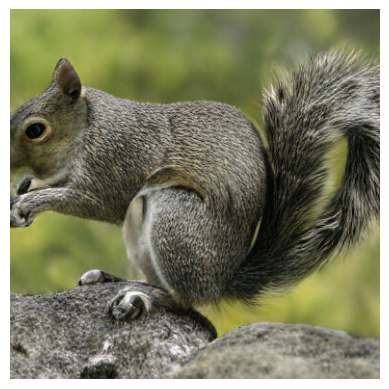

In [24]:
x=img*2-1
xrec = model1024(x.to(DEVICE))
import matplotlib.pyplot as plt
plt.figure(dpi=100)
plt.imshow(xrec[0][0].cpu().permute(1,2,0)*0.5+0.5)
plt.axis("off")
plt.show()

## 4.2 Reconstruct Images in the Flickr 8k Dataset
Now, let's use the same five images we used in the last section from the Flickr 8k dataset. We'll resize the images from 256x256 to 284x384: 

In [25]:
from torchvision import transforms as T

transform = T.Compose([T.Resize((size,size))])
newimgs=transform(imgs)
print(newimgs.shape)

torch.Size([5, 3, 384, 384])


We can now feed the five images to the pretrained VQGAN to obtain the reconstructed images and display them:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


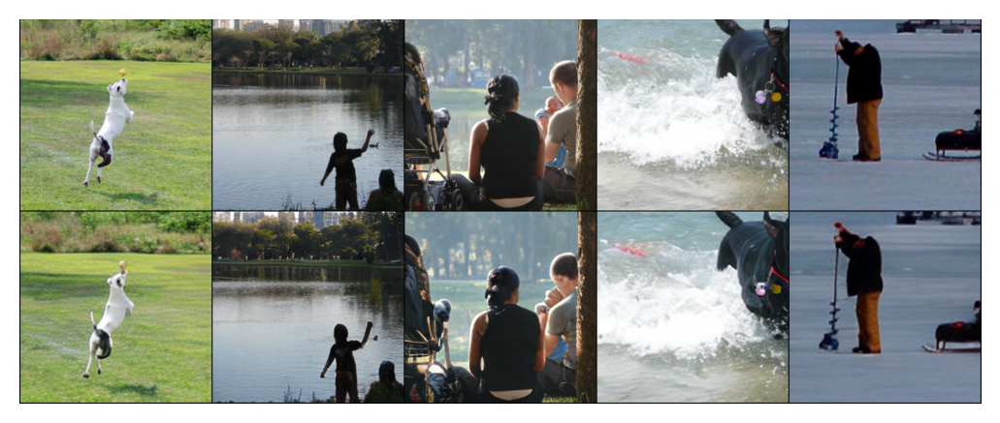

In [26]:
xrecs = model1024(newimgs.to(DEVICE))

real_fake_images = torch.cat((newimgs,
                  xrecs[0])).add(1).mul(0.5)
grid_img=vutils.make_grid(real_fake_images,nrow=5)
plt.figure(dpi=200)
plt.imshow(grid_img.permute(1, 2, 0).cpu())
plt.axis("off")
plt.show()

We can try another five images as follows:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


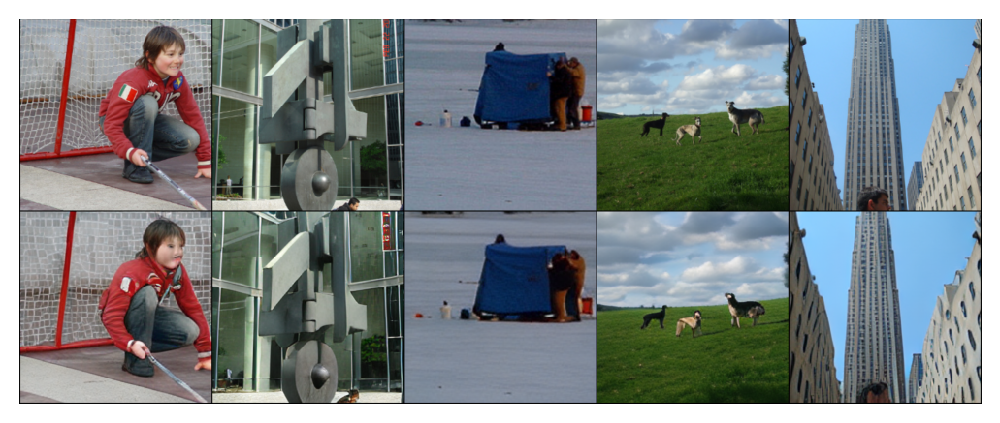

In [27]:
test=[]
for i in range(5):
    test.append(torch.Tensor(trainset[25+i]).unsqueeze(0))
imgs=torch.cat(test)
newimgs=transform(imgs).to(DEVICE)
xrecs = model1024(newimgs)
real_fake_images = torch.cat((newimgs,
                              xrecs[0])).add(1).mul(0.5)
grid_img=vutils.make_grid(real_fake_images,nrow=5)
plt.figure(dpi=200)
plt.imshow(grid_img.permute(1, 2, 0).cpu())
plt.axis("off")
plt.show()

As you can see, even though the reconstructed images look similar to the original images, the human faces are lightly distorted. This is a known problem for VQGANs. 